In [1]:
 # RIO-125: Rank Features of a Smartphone - Build a Python Application to Classify and Rank Dataset 

## Rank Features of a Smartphone - Build a Python Application to Classify and Rank Dataset

####  The data contains information regarding mobile phone features, specifications etc and their price range. The various features and information can be used to predict the price range of a mobile phone.

In [2]:
# Importing all the necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline 
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
import plotly.offline as pyo

In [3]:
# Read the datasets
df_train = pd.read_csv(r'C:\Users\Arathi\Downloads\MobileTrain.csv')


df_test = pd.read_csv(r'C:\Users\Arathi\Downloads\MobileTest.csv')

### Train dataset

In [4]:
df_train.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [5]:
df_train.tail()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,...,483,754,3919,19,4,2,1,1,1,3


### Description Of Dataset

In [6]:
# check the shape of the data set
df_train.shape

(2000, 21)

The train dataset contains 2000 rows and 21 columns and the test dataset contains 1000 rows and 20 columns.



In [7]:
# check the columns of the data set
print("The features of Smarphone Dataset are:")

features = len(df_train.columns)
features_list = [feature for feature in df_train.columns]

for feature in features_list:
    print(feature)

The features of Smarphone Dataset are:
battery_power
blue
clock_speed
dual_sim
fc
four_g
int_memory
m_dep
mobile_wt
n_cores
pc
px_height
px_width
ram
sc_h
sc_w
talk_time
three_g
touch_screen
wifi
price_range


In [8]:
df_train.index

RangeIndex(start=0, stop=2000, step=1)

In [9]:
df_train.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

This dataset has no categorical features, so we can just use this data without any transformation because all the features of the dataset are numeric.

In [10]:
# Getting information of the dataset like non-null count and Data type of each column.
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [11]:
# Summary of the data
df_train.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


### preprocessing of train dataset


 check if there are any null and duplicate values in the dataset.Then, we will remove some of the outliers from our dataset.

In [12]:
# checking number null values in the dataset
df_train.isna().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

There is no null values in dataset

In [13]:
# getting number of unique values in the dataset
df_train.nunique()

battery_power    1094
blue                2
clock_speed        26
dual_sim            2
fc                 20
four_g              2
int_memory         63
m_dep              10
mobile_wt         121
n_cores             8
pc                 21
px_height        1137
px_width         1109
ram              1562
sc_h               15
sc_w               19
talk_time          19
three_g             2
touch_screen        2
wifi                2
price_range         4
dtype: int64

In [14]:
# examining target variable
df_train['price_range'].value_counts()

1    500
2    500
3    500
0    500
Name: price_range, dtype: int64

 There are mobile phones in 4 price ranges. The number of elements is similar. display our target feature “price range” and as you can see  0, 1, 2 and 3 all have 500 rows. It means there is no imbalanced dataset.

### Exploratory Data Analysis on the Dataset

 Let’s look at the training data  and see if we can draw some useful inferences. This will give us a fair idea about what our approaches to solving the problem should be.

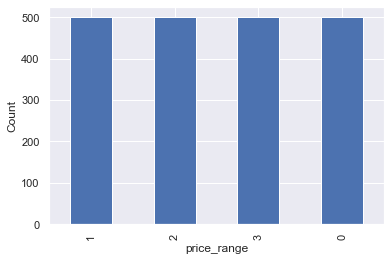

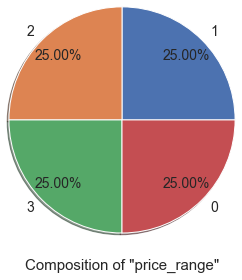

In [15]:
# checking the target
#classes
# barplot
sns.set()
price_plot= df_train['price_range'].value_counts().plot(kind='bar')
plt.xlabel('price_range')
plt.ylabel('Count')
plt.show()


# pieplot
ax2= plt.subplot()
plt.pie(x=df_train['price_range'].value_counts(),
        labels=list(df_train['price_range'].unique()),
        autopct='%2.2f%%',
        pctdistance=0.8,
        shadow=True,
        radius=1.3,
        textprops={'fontsize':14})
ax2.set_xlabel(" ")
plt.xlabel('Composition of "price_range"', fontsize=15, labelpad=30)
plt.subplots_adjust(wspace=0.4)
plt.show()

 Now display our target feature “price range” and as you can see in the graph, 0, 1, 2 and 3 all have 500 rows. It means there is no imbalanced dataset.

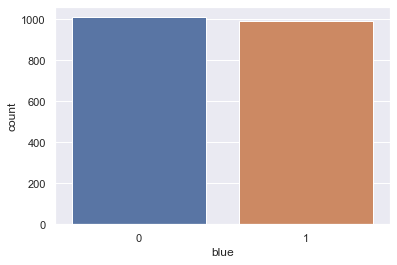

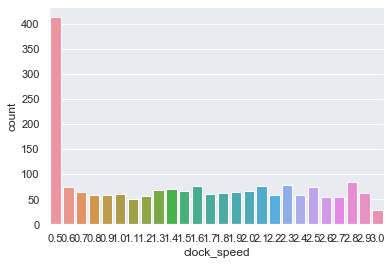

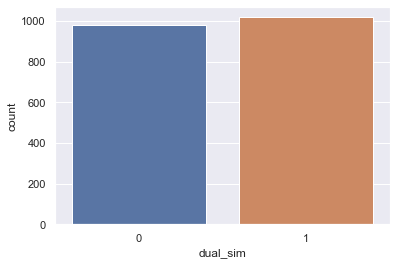

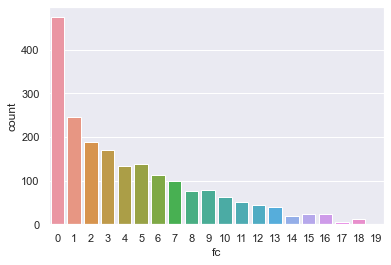

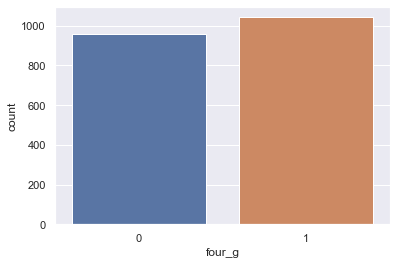

...

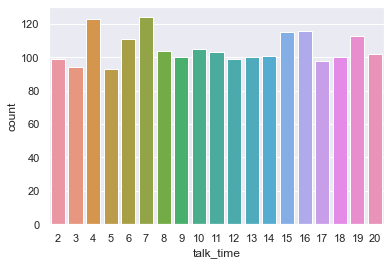

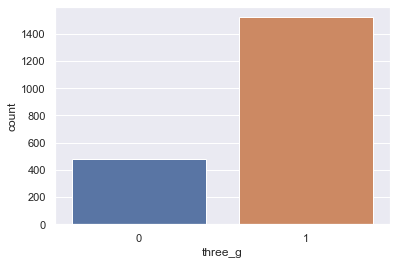

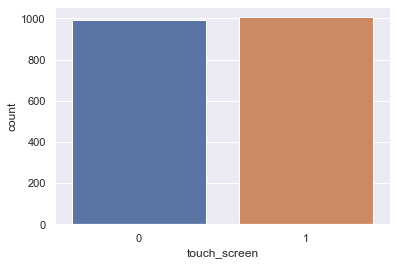

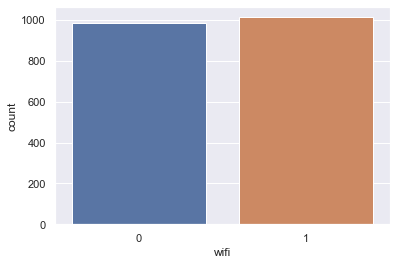

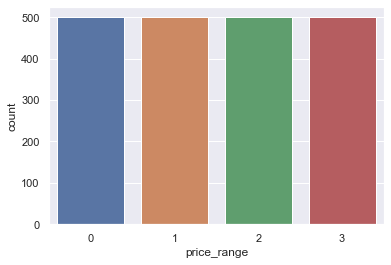

In [16]:
# Data Distribution
# Let us analyse some data features and see their distribution.

#CountPlot for various columns
for i in df_train:
    if(df_train[i].nunique()<30):
        sns.countplot(x=df_train[i])
        plt.show()

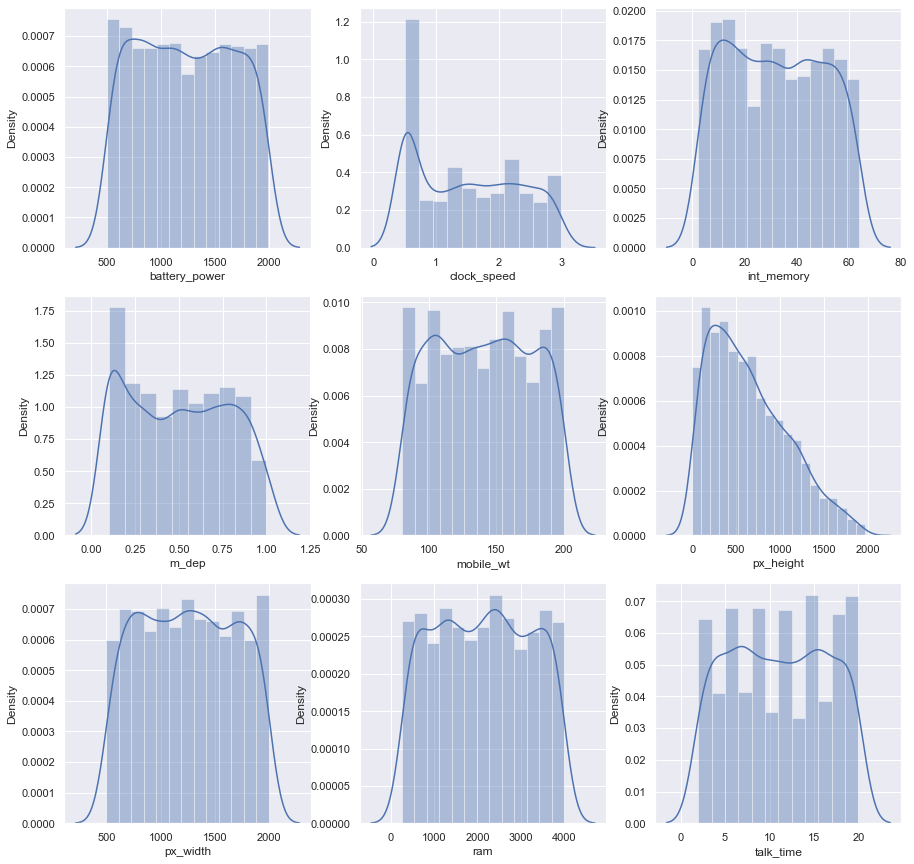

In [17]:
#Distplot for various columns
plt.figure(figsize = (15,15))
plt.subplot(331)
sns.distplot(df_train['battery_power'])
plt.subplot(332)
sns.distplot(df_train['clock_speed'])
plt.subplot(333)
sns.distplot(df_train['int_memory'])
plt.subplot(334)
sns.distplot(df_train['m_dep'])
plt.subplot(335)
sns.distplot(df_train['mobile_wt'])
plt.subplot(336)
sns.distplot(df_train['px_height'])
plt.subplot(337)
sns.distplot(df_train['px_width'])
plt.subplot(338)
sns.distplot(df_train['ram'])
plt.subplot(339)
sns.distplot(df_train['talk_time'])
plt.show()

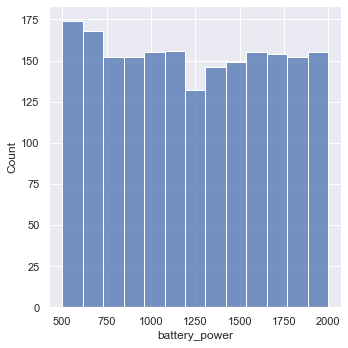

In [18]:
 # we see how the battery mAh is spread.

sns.set(rc={'figure.figsize':(5,5)})
ax=sns.displot(data=df_train["battery_power"])
plt.show()

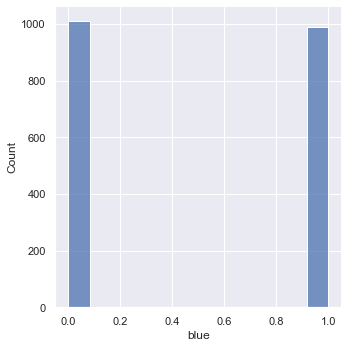

In [19]:
# Now, we see the count of how many devices have Bluetooth and how many don’t.

sns.set(rc={'figure.figsize':(5,5)})
ax=sns.displot(data=df_train["blue"])
plt.show()

So, we can see that half the devices have Bluetooth, and half don’t.

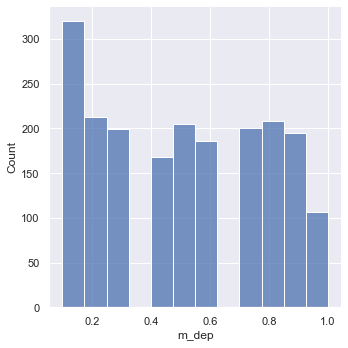

In [20]:
# Next, we analyse the mobile depth ( in cm).
sns.set(rc={'figure.figsize':(5,5)})
ax=sns.displot(data=df_train["m_dep"])
plt.show()


<AxesSubplot:xlabel='price_range', ylabel='battery_power'>

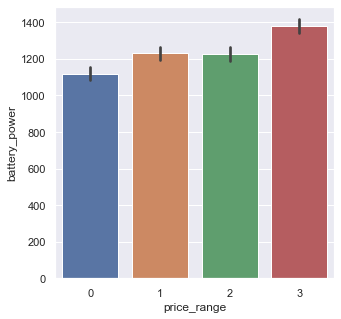

In [21]:
plt.figure()
sns.barplot(y="battery_power", x="price_range", data=df_train)

 ##### Pie charts on various columns of the dataset

In [22]:
import plotly.express as px

#bluetooth devices
df_train["is_bluetooth"]=''
for i in range(len(df_train)):
    if df_train['blue'][i]==0:
        df_train['is_bluetooth'][i]='No'
    else:
        df_train['is_bluetooth'][i]='Yes'
df_train

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range,is_bluetooth
0,842,0,2.2,0,1,0,7,0.6,188,2,...,756,2549,9,7,19,0,0,1,1,No
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,1988,2631,17,3,7,1,1,0,2,Yes
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1716,2603,11,2,9,1,1,0,2,Yes
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1786,2769,16,8,11,1,0,0,2,Yes
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1212,1411,8,2,15,1,1,0,1,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1890,668,13,4,19,1,1,0,0,Yes
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,1965,2032,11,10,16,1,1,1,2,Yes
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,1632,3057,9,1,5,1,1,0,3,No
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,670,869,18,10,19,1,1,1,0,No


In [23]:
px.pie(data_frame = df_train, names = 'is_bluetooth', title = 'Percentage of devices having bluetooth', hole= 0.2)

<BarContainer object of 2 artists>

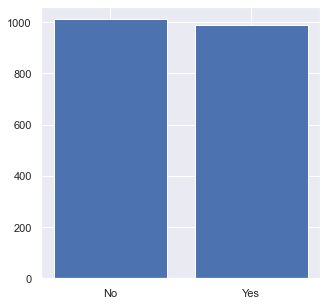

In [24]:
# Bar chart of bluetooth
dg=df_train.groupby('is_bluetooth')
dg=dg.count()
plt.bar(dg.index,dg.blue)

There are approximately the same numnber

In [25]:
# Dual SIM 
df_train["isDualSIM"]=''
for i in range(len(df_train)):
    if df_train["dual_sim"][i]==0:
        df_train["isDualSIM"][i]="No"
    else:
        df_train["isDualSIM"][i]="Yes"
px.pie(data_frame=df_train, names="isDualSIM", title="Percentage of devices having Dual SIM", hole=0.3)


In [26]:
# 4G
df_train["is_4G"]=''
for i in range(len(df_train)):
    if df_train["four_g"][i]==0:
        df_train["is_4G"][i]="No"
    else:
        df_train["is_4G"][i]="Yes"
px.pie(data_frame=df_train, names="is_4G", title="Percentage of devices having 4G", hole=0.3)

In [27]:
# 3G
df_train["is_3G"]=''
for i in range(len(df_train)):
    if df_train['three_g'][i]==0:
        df_train['is_3G'][i]='No'
    else:
        df_train['is_3G'][i]='Yes'
px.pie(data_frame = df_train, names = 'is_3G', title = 'Percentage of devices having 3G connection', hole= 0.2)

In [28]:
# WiFi
df_train["isWiFi"]=''
for i in range(len(df_train)):
    if df_train["wifi"][i]==0:
        df_train["isWiFi"][i]="No"
    else:
        df_train["isWiFi"][i]="Yes"
px.pie(data_frame=df_train, names="isWiFi", title="Percentage of devices having  Wifi", hole=0.3)

In [29]:
# Touch Screen
df_train["is_touchscreen"]=''
for i in range(len(df_train)):
    if df_train['touch_screen'][i]==0:
        df_train['is_touchscreen'][i]='No'
    else:
        df_train['is_touchscreen'][i]='Yes'
px.pie(data_frame = df_train, names = 'is_touchscreen', title = 'Percentage of devices having touch screen', hole= 0.2)


In [30]:
# Processors
df_train["cores"]=''
for i in range(len(df_train)):
    if df_train['n_cores'][i]==1:
        df_train['cores'][i]='single core'
    elif df_train['n_cores'][i]==2:
        df_train['cores'][i]='dual core'
    elif df_train['n_cores'][i]==3:
        df_train['cores'][i]='triple core'
    elif df_train['n_cores'][i]==4:
        df_train['cores'][i]='quad core'
    elif df_train['n_cores'][i]==5:
        df_train['cores'][i]='penta core'
    elif df_train['n_cores'][i]==6:
        df_train['cores'][i]='hexa core'
    elif df_train['n_cores'][i]==7:
        df_train['cores'][i]='hepta core'
    else:
        df_train['cores'][i]='octa core'
px.pie(data_frame = df_train, names = 'cores', title = 'Percentage of devices having different types of cores', hole= 0.2)

<BarContainer object of 8 artists>

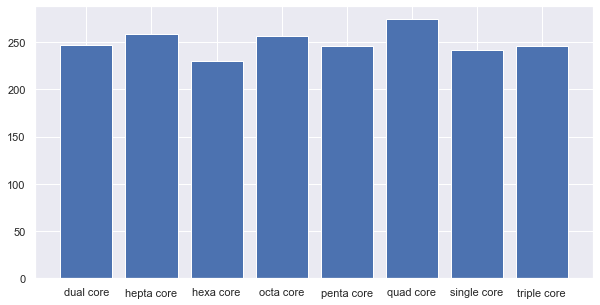

In [31]:
# Bar chart of core
dg=df_train.groupby('cores')
dg=dg.count()
fig = plt.figure(figsize = (10, 5))
plt.bar(dg.index,dg.blue)

peoples using quad core processor most

In [32]:
df_train.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,touch_screen,wifi,price_range,is_bluetooth,isDualSIM,is_4G,is_3G,isWiFi,is_touchscreen,cores
0,842,0,2.2,0,1,0,7,0.6,188,2,...,0,1,1,No,No,No,No,Yes,No,dual core
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,1,0,2,Yes,Yes,Yes,Yes,No,Yes,triple core
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1,0,2,Yes,Yes,Yes,Yes,No,Yes,penta core
3,615,1,2.5,0,0,0,10,0.8,131,6,...,0,0,2,Yes,No,No,Yes,No,No,hexa core
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1,0,1,Yes,No,Yes,Yes,No,Yes,dual core


In [33]:
# Histogram using plotly.express library on various columns

(array([242., 247., 246.,   0., 274., 246.,   0., 230., 259., 256.]),
 array([1. , 1.7, 2.4, 3.1, 3.8, 4.5, 5.2, 5.9, 6.6, 7.3, 8. ]),
 <BarContainer object of 10 artists>)

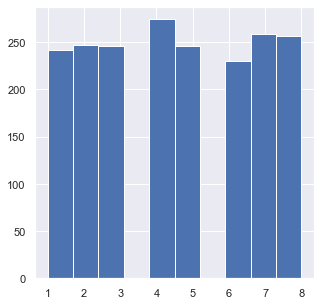

In [34]:
plt.hist(df_train.n_cores)

In [35]:
px.histogram(data_frame=df_train, x="is_bluetooth", color="price_range", title="Comparison according to price range of bluetooth devices or not")

In [36]:
px.histogram(data_frame=df_train, x="isDualSIM", color="price_range", title="Comparison according to price range of Dual SIM devices or not")

In [37]:
px.histogram(data_frame=df_train, x="is_4G", color="price_range", title="Comparison according to price range of 4G devices or not")

In [38]:
px.histogram(data_frame=df_train, x="cores", color="price_range", title="Comparison according to price range of number of cores per device")


pair plot of dataset

<Figure size 1440x1080 with 0 Axes>

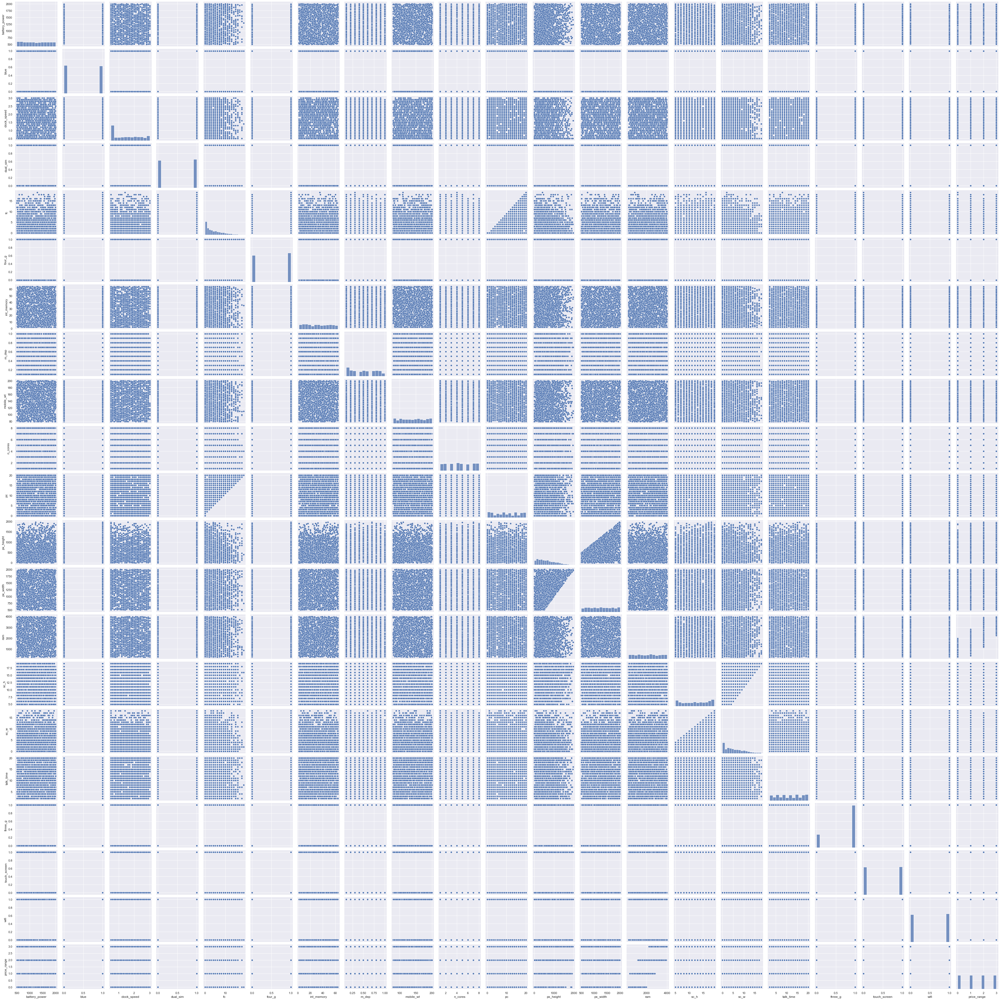

In [39]:
plt.figure(figsize=(20,15))
sns.pairplot(df_train)
plt.show()

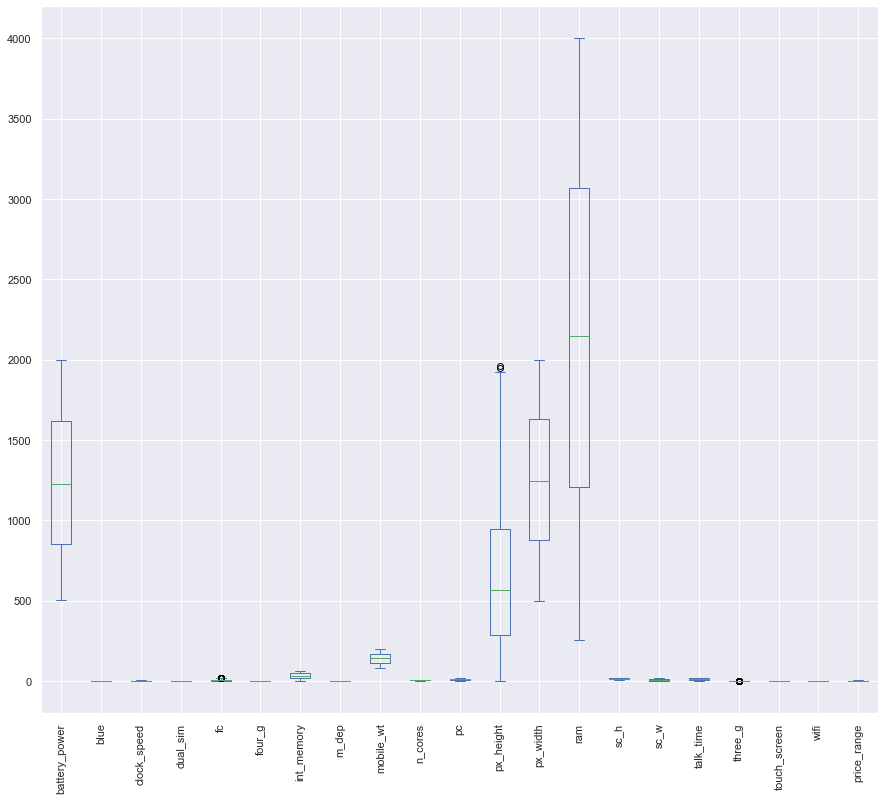

In [40]:
# check the outliers in the dataset.  #5 summury statistics
df_train.plot(kind='box',figsize=(15,13))
plt.xticks(rotation = 90)
plt.show()

##### Feature Observation

[0.02962591 0.01499432 0.02915329 0.01555029 0.02780474 0.01079922
 0.02913582 0.02714708 0.0300452  0.5436369  0.02846262 0.02900657
 0.03007373 0.0293118  0.02854225 0.02827533 0.02806373 0.00843955
 0.01574622 0.01618542]


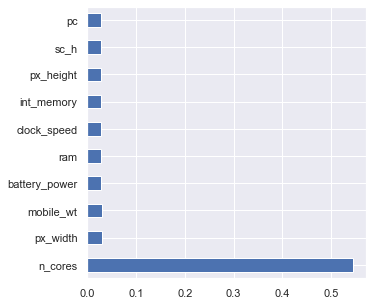

In [41]:
# feature_importances
X = df_train.iloc[:,0:20]  
y = df_train.iloc[:,-1]    
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

The dataset contains 21 columns and luckily this dataset has no missing values, so we can just start by training the model, but before that let’s take a look at the correlation between the features in the dataset:

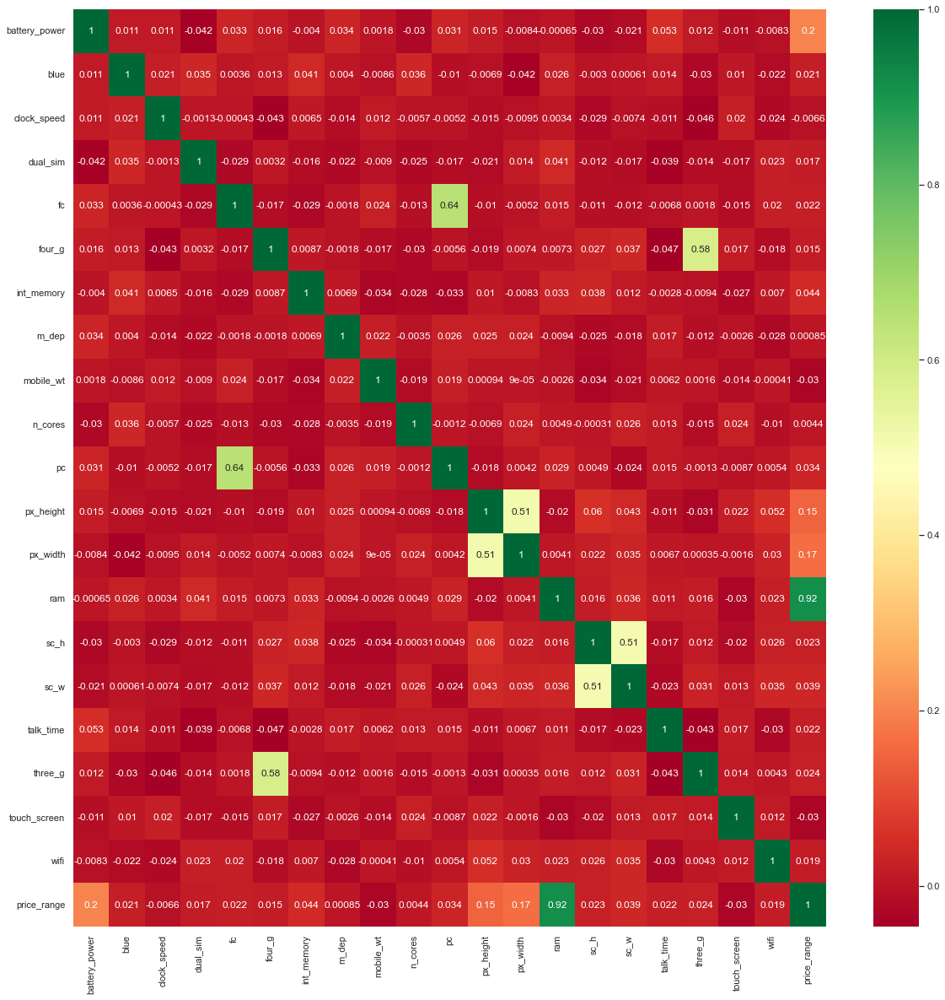

In [42]:
# Understanding the correlation of features between target and other features
# Plotting the heatmap of correlation between features.
X = df_train.iloc[:,0:20]  
y = df_train.iloc[:,-1]    
corrmat = df_train.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
g=sns.heatmap(df_train[top_corr_features].corr(),annot=True,cmap="RdYlGn")

see how the price range is correlated with other features, ram is the highly correlated with price range followed by battery power, pixel height and width while m_dep, clock_speed and n_cores seems to be least correlated with price_range.

 Now check the correlation of the features for the knowledge only. Because there is no need to check correlation. All features are necessary to predict the price range of the mobile.

In [43]:
DF1 = df_train.loc[:,['battery_power','blue','dual_sim','fc','four_g','int_memory','m_dep','mobile_wt','n_cores','pc','px_height','px_width','ram','sc_h','sc_w','talk_time','three_g','wifi','price_range']]
DF1

,battery_power,blue,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,wifi,price_range
0,842,0,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,1,1
1,1021,1,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,0,2
2,563,1,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,0,2
3,615,1,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,2
4,1821,1,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,1,0,1,2,0.8,106,6,14,1222,1890,668,13,4,19,1,0,0
1996,1965,1,1,0,0,39,0.2,187,4,3,915,1965,2032,11,10,16,1,1,2
1997,1911,0,1,1,1,36,0.7,108,8,3,868,1632,3057,9,1,5,1,0,3
1998,1512,0,0,4,1,46,0.1,145,5,5,336,670,869,18,10,19,1,1,0


In [44]:
DF2 = df_train.loc[:,['touch_screen','clock_speed']]
DF2

,touch_screen,clock_speed
0,0,2.2
1,1,0.5
2,1,0.5
3,0,2.5
4,1,1.2
...,...,...
1995,1,0.5
1996,1,2.6
1997,1,0.9
1998,1,0.9


### Merging Dataset

In [45]:
DF3 = pd.concat([DF1 , DF2], axis=1)
DF3

,battery_power,blue,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,...,px_width,ram,sc_h,sc_w,talk_time,three_g,wifi,price_range,touch_screen,clock_speed
0,842,0,0,1,0,7,0.6,188,2,2,...,756,2549,9,7,19,0,1,1,0,2.2
1,1021,1,1,0,1,53,0.7,136,3,6,...,1988,2631,17,3,7,1,0,2,1,0.5
2,563,1,1,2,1,41,0.9,145,5,6,...,1716,2603,11,2,9,1,0,2,1,0.5
3,615,1,0,0,0,10,0.8,131,6,9,...,1786,2769,16,8,11,1,0,2,0,2.5
4,1821,1,0,13,1,44,0.6,141,2,14,...,1212,1411,8,2,15,1,0,1,1,1.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,1,0,1,2,0.8,106,6,14,...,1890,668,13,4,19,1,0,0,1,0.5
1996,1965,1,1,0,0,39,0.2,187,4,3,...,1965,2032,11,10,16,1,1,2,1,2.6
1997,1911,0,1,1,1,36,0.7,108,8,3,...,1632,3057,9,1,5,1,0,3,1,0.9
1998,1512,0,0,4,1,46,0.1,145,5,5,...,670,869,18,10,19,1,1,0,1,0.9


### Rank The Features

### Ranking According to Price Range

In [46]:
df_train["rank_by_price"] = df_train["price_range"].rank()
dt1 = df_train
dt1.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,wifi,price_range,is_bluetooth,isDualSIM,is_4G,is_3G,isWiFi,is_touchscreen,cores,rank_by_price
0,842,0,2.2,0,1,0,7,0.6,188,2,...,1,1,No,No,No,No,Yes,No,dual core,750.5
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,0,2,Yes,Yes,Yes,Yes,No,Yes,triple core,1250.5
2,563,1,0.5,1,2,1,41,0.9,145,5,...,0,2,Yes,Yes,Yes,Yes,No,Yes,penta core,1250.5
3,615,1,2.5,0,0,0,10,0.8,131,6,...,0,2,Yes,No,No,Yes,No,No,hexa core,1250.5
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,0,1,Yes,No,Yes,Yes,No,Yes,dual core,750.5


In [47]:
dt1["rank_by_price"] = dt1["rank_by_price"].sort_values()
dt1


,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,wifi,price_range,is_bluetooth,isDualSIM,is_4G,is_3G,isWiFi,is_touchscreen,cores,rank_by_price
0,842,0,2.2,0,1,0,7,0.6,188,2,...,1,1,No,No,No,No,Yes,No,dual core,750.5
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,0,2,Yes,Yes,Yes,Yes,No,Yes,triple core,1250.5
2,563,1,0.5,1,2,1,41,0.9,145,5,...,0,2,Yes,Yes,Yes,Yes,No,Yes,penta core,1250.5
3,615,1,2.5,0,0,0,10,0.8,131,6,...,0,2,Yes,No,No,Yes,No,No,hexa core,1250.5
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,0,1,Yes,No,Yes,Yes,No,Yes,dual core,750.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,0,0,Yes,Yes,Yes,Yes,No,Yes,hexa core,250.5
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,1,2,Yes,Yes,No,Yes,Yes,Yes,quad core,1250.5
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,0,3,No,Yes,Yes,Yes,No,Yes,octa core,1750.5
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,1,0,No,No,Yes,Yes,Yes,Yes,penta core,250.5


### Sorting Ranking Dataset (Sorting above dataset according to ranked_price_range)

In [48]:
dt1.sort_values(by=["rank_by_price"])


,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,wifi,price_range,is_bluetooth,isDualSIM,is_4G,is_3G,isWiFi,is_touchscreen,cores,rank_by_price
1838,720,1,0.9,1,12,1,14,0.8,165,4,...,0,0,Yes,Yes,Yes,Yes,No,Yes,quad core,250.5
1762,808,1,0.5,1,3,0,46,0.5,105,8,...,1,0,Yes,Yes,No,Yes,Yes,No,octa core,250.5
419,914,1,0.9,0,2,0,4,0.8,100,2,...,0,0,Yes,No,No,Yes,No,Yes,dual core,250.5
846,1489,0,2.4,1,8,0,32,0.6,200,1,...,0,0,No,Yes,No,No,No,No,single core,250.5
845,1907,0,2.0,0,13,0,55,0.9,105,7,...,1,0,No,No,No,Yes,Yes,No,hepta core,250.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
981,1046,1,2.8,1,0,1,58,0.2,100,8,...,1,3,Yes,Yes,Yes,Yes,Yes,Yes,octa core,1750.5
982,1035,0,0.6,1,2,1,44,0.5,99,3,...,0,3,No,Yes,Yes,Yes,No,Yes,triple core,1750.5
987,1688,0,2.5,0,0,1,21,0.2,170,7,...,1,3,No,No,Yes,Yes,Yes,Yes,hepta core,1750.5
956,862,0,2.3,0,9,1,6,0.1,107,8,...,1,3,No,No,Yes,Yes,Yes,Yes,octa core,1750.5


In [49]:
dt1.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,wifi,price_range,is_bluetooth,isDualSIM,is_4G,is_3G,isWiFi,is_touchscreen,cores,rank_by_price
0,842,0,2.2,0,1,0,7,0.6,188,2,...,1,1,No,No,No,No,Yes,No,dual core,750.5
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,0,2,Yes,Yes,Yes,Yes,No,Yes,triple core,1250.5
2,563,1,0.5,1,2,1,41,0.9,145,5,...,0,2,Yes,Yes,Yes,Yes,No,Yes,penta core,1250.5
3,615,1,2.5,0,0,0,10,0.8,131,6,...,0,2,Yes,No,No,Yes,No,No,hexa core,1250.5
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,0,1,Yes,No,Yes,Yes,No,Yes,dual core,750.5


## Ranking on all the features using rank()

In [50]:
dt2 = pd.read_csv(r"C:\Users\Arathi\Downloads\MobileTrain.csv")
RankedDataset1 = dt2.rank()
RankedDataset1.sort_values(by="price_range")

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1838,320.5,1505.5,638.5,1491.0,1853.0,1479.0,432.0,1595.5,1414.5,872.5,...,657.5,978.0,445.5,1214.0,1284.5,146.5,1239.0,1497.5,493.5,250.5
1762,435.5,1505.5,207.0,1491.0,993.5,479.0,1451.5,1003.0,436.0,1872.5,...,189.0,45.0,442.0,1353.0,1008.0,901.0,1239.0,497.5,1493.5,250.5
419,589.0,1505.5,638.5,491.0,814.0,479.0,77.5,1595.5,325.5,366.0,...,329.5,1341.0,306.0,791.5,1284.5,363.0,1239.0,1497.5,493.5,250.5
846,1323.5,505.5,1612.5,1491.0,1601.0,479.0,1011.0,1198.5,1991.0,121.5,...,288.0,408.0,292.0,287.0,1153.5,696.5,239.0,497.5,493.5,250.5
845,1875.0,505.5,1337.0,491.0,1895.5,479.0,1727.0,1797.0,436.0,1615.0,...,1231.5,1363.0,16.0,1214.0,836.5,1636.5,1239.0,497.5,1493.5,250.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
981,753.0,1505.5,1868.0,1491.0,237.5,1479.0,1828.5,427.0,325.5,1872.5,...,455.0,728.0,1919.0,1660.0,1797.5,798.5,1239.0,1497.5,1493.5,1750.5
982,737.5,505.5,450.5,1491.0,814.0,1479.0,1382.0,1003.0,309.0,612.5,...,419.5,1937.0,1732.0,1214.0,1008.0,1106.0,1239.0,1497.5,493.5,1750.5
987,1583.0,505.5,1678.5,491.0,237.5,1479.0,669.5,427.0,1496.0,1615.0,...,1134.0,481.5,1994.0,1660.0,1897.0,696.5,1239.0,1497.5,1493.5,1750.5
956,515.5,505.5,1544.5,491.0,1678.5,1479.0,142.0,160.5,472.5,1872.5,...,1371.0,1966.0,1703.5,541.5,836.5,798.5,1239.0,1497.5,1493.5,1750.5


### Ranking all the features separately to correct output.


In [51]:

# because not all features are good when values are high and not all features are good when values are low

# It depends on each and every feature
b = dt2
b["rank_by_price"] = b["price_range"].rank()
b["rank_by_battery"] = b["battery_power"].rank(ascending=False)
b["rank_by_blueooth"] = b["blue"].rank(ascending=False)
b["rank_by_clockspeed"] = b["clock_speed"].rank(ascending=False)
b["rank_by_DualSIM"] = b["dual_sim"].rank(ascending=False)
b["rank_by_fc"] = b["fc"].rank(ascending=False)
b["rank_by_4G"] = b["four_g"].rank(ascending=False)
b["rank_by_InternalMemory"] = b["int_memory"].rank(ascending=False)
b["rank_by_mdep"] = b["m_dep"].rank(ascending=False)
b["rank_by_weight"] = b["mobile_wt"].rank(ascending=True)
b["rank_by_ncores"] = b["n_cores"].rank(ascending=False)
b["rank_by_pc"] = b["pc"].rank(ascending=False)
b["rank_by_height"] = b["px_height"].rank(ascending=False)
b["rank_by_width"] = b["px_width"].rank(ascending=False)
b["rank_by_ram"] = b["ram"].rank(ascending=False)
b["rank_by_sch"] = b["sc_h"].rank(ascending=False)
b["rank_by_scw"] = b["sc_w"].rank(ascending=False)
b["rank_by_talktime"] = b["talk_time"].rank(ascending=False)
b["rank_by_3G"] = b["three_g"].rank(ascending=False)
b["rank_by_touchscreen"] = b["touch_screen"].rank(ascending=False)
b["rank_by_wifi"] = b["wifi"].rank(ascending=False)
b.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,rank_by_pc,rank_by_height,rank_by_width,rank_by_ram,rank_by_sch,rank_by_scw,rank_by_talktime,rank_by_3G,rank_by_touchscreen,rank_by_wifi
0,842,0,2.2,0,1,0,7,0.6,188,2,...,1746.0,1972.5,1664.5,762.5,1459.5,716.5,159.0,1762.0,1503.5,507.5
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,1402.0,545.5,17.0,714.0,341.0,1355.0,1418.5,762.0,503.5,1507.5
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1402.0,212.0,386.5,732.0,1209.5,1532.5,1202.5,762.0,503.5,1507.5
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1090.5,250.0,287.0,639.0,509.0,588.0,996.0,762.0,1503.5,1507.5
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,606.5,261.5,1054.0,1375.0,1580.0,1532.5,587.0,762.0,503.5,1507.5


In [52]:
RankedDataset2 = b.iloc[:,21:]
RankedDataset2


,rank_by_price,rank_by_battery,rank_by_blueooth,rank_by_clockspeed,rank_by_DualSIM,rank_by_fc,rank_by_4G,rank_by_InternalMemory,rank_by_mdep,rank_by_weight,...,rank_by_pc,rank_by_height,rank_by_width,rank_by_ram,rank_by_sch,rank_by_scw,rank_by_talktime,rank_by_3G,rank_by_touchscreen,rank_by_wifi
0,750.5,1512.5,1495.5,525.0,1510.0,1404.0,1522.0,1820.5,802.5,1783.5,...,1746.0,1972.5,1664.5,762.5,1459.5,716.5,159.0,1762.0,1503.5,507.5
1,1250.5,1278.5,495.5,1794.0,510.0,1763.5,522.0,334.5,609.5,932.5,...,1402.0,545.5,17.0,714.0,341.0,1355.0,1418.5,762.0,503.5,1507.5
2,1250.5,1909.5,495.5,1794.0,510.0,1187.0,522.0,720.0,204.0,1069.0,...,1402.0,212.0,386.5,732.0,1209.5,1532.5,1202.5,762.0,503.5,1507.5
3,1250.5,1830.0,495.5,322.5,1510.0,1763.5,1522.0,1710.5,405.5,846.0,...,1090.5,250.0,287.0,639.0,509.0,588.0,996.0,762.0,1503.5,1507.5
4,750.5,242.0,495.5,1193.5,1510.0,105.5,522.0,619.0,802.5,1006.0,...,606.5,261.5,1054.0,1375.0,1580.0,1532.5,587.0,762.0,503.5,1507.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,250.5,1587.5,495.5,1794.0,510.0,1763.5,522.0,1979.5,405.5,456.0,...,606.5,244.5,163.0,1767.0,924.0,1164.5,159.0,762.0,503.5,1507.5
1996,1250.5,58.0,495.5,258.0,510.0,1763.5,1522.0,784.5,1574.0,1766.5,...,1650.0,536.0,54.5,1062.0,1209.5,375.0,471.5,762.0,503.5,507.5
1997,1750.5,121.5,1495.5,1362.5,510.0,1404.0,522.0,860.0,609.5,486.5,...,1650.0,583.5,502.0,504.0,1459.5,1715.5,1638.0,762.0,503.5,1507.5
1998,250.5,648.0,1495.5,1362.5,1510.0,856.0,522.0,549.5,1840.5,1069.0,...,1479.0,1395.5,1792.5,1664.5,184.5,375.0,159.0,762.0,503.5,507.5


### Data Splitting and Data Scaling

In [53]:
df_train = pd.read_csv(r'C:\Users\Arathi\Downloads\MobileTrain.csv')
df_train


,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


In [54]:
x = df_train.iloc[:, :-1].values
y = df_train.iloc[:, -1].values

### Standardisation

In [55]:
# scaling 
from sklearn.preprocessing import StandardScaler
sc_x = StandardScaler()
x = sc_x.fit_transform(x)


In [56]:

from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25, random_state=0)

In [57]:

print('Shape of Training Features: ',x_train.shape)
print("Shape of Testing Features: ",x_test.shape)
print("Shape of Training Target: ",y_train.shape)
print("Shape of Testig Target: ",y_test.shape)

Shape of Training Features:  (1500, 20)
Shape of Testing Features:  (500, 20)
Shape of Training Target:  (1500,)
Shape of Testig Target:  (500,)


### Model Building

In [58]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [59]:
#logistic Regression
log=LogisticRegression()
log.fit(x_train,y_train)
print("Training score of LogisticRegression is: {}".format(log.score(x_train,y_train)))
y_predlog=log.predict(x_test)
print(y_predlog)
acrr=accuracy_score(y_test,y_predlog)*100
print("Accuracy of Logistic Regression Classifier is: {}%".format(acrr))
print("Confusion matrix Logistic Regression Classifier is: \n{}".format(confusion_matrix(y_test,y_predlog)))
print("{}".format(classification_report(y_test,y_predlog)))

Training score of LogisticRegression is: 0.9793333333333333
[3 0 2 2 3 0 0 3 3 1 1 3 0 2 3 0 3 2 2 1 0 0 3 1 2 2 3 1 3 1 1 0 2 0 1 3 0
 0 3 3 3 1 3 3 1 3 0 1 3 1 1 3 0 3 0 2 2 2 0 3 3 1 3 2 1 2 3 2 2 2 3 2 1 0
 1 3 2 2 1 2 3 3 3 0 0 0 2 1 2 3 1 2 2 1 0 3 3 3 0 3 1 1 2 1 3 2 2 3 2 3 3
 0 0 1 3 3 0 0 1 0 0 3 2 2 1 2 1 1 0 2 1 3 3 3 3 3 3 2 0 1 1 2 1 3 0 3 0 0
 2 0 1 1 1 1 3 0 0 3 1 3 2 1 3 1 2 3 3 2 1 0 3 1 2 3 3 0 2 2 3 1 2 1 0 1 2
 1 2 0 3 3 1 1 0 2 3 0 1 2 2 0 3 3 3 1 2 3 3 3 0 0 0 2 3 3 0 0 1 3 2 3 3 3
 0 0 2 3 3 1 0 2 0 0 0 3 2 1 2 2 1 1 0 2 3 3 0 0 1 3 3 1 3 0 3 1 1 0 2 3 3
 2 0 0 1 2 3 2 2 3 1 1 0 3 3 2 1 3 2 2 2 1 0 2 2 1 0 0 2 2 2 3 0 1 3 0 2 2
 3 0 2 0 1 1 3 0 0 2 3 1 2 0 2 0 3 0 3 3 2 3 1 2 2 1 1 2 0 1 0 3 1 0 3 0 0
 1 3 0 3 1 1 0 1 3 0 2 1 1 2 1 1 0 2 0 0 3 1 2 3 2 2 0 3 2 2 1 3 2 3 3 3 0
 2 0 3 0 1 1 2 3 1 3 1 2 0 1 2 3 0 0 1 3 0 3 0 2 2 1 1 0 2 0 0 1 3 0 3 3 0
 2 1 3 1 1 3 2 0 3 2 2 0 0 3 0 1 1 1 3 2 3 2 0 3 0 0 1 3 0 0 3 2 2 2 3 0 0
 1 2 1 2 0 3 3 0 3 3 0 2 2 1 0 2 2 1 3 2

In [60]:
#Naive Bayes
from sklearn.naive_bayes import GaussianNB
nb=GaussianNB()
nb.fit(x_train,y_train)
print("Training score of GaussianNB is {}".format(nb.score(x_train,y_train)*100))
y_pred=nb.predict(x_test)
print(y_pred)
ac_nb=accuracy_score(y_test,y_pred)*100
print("Accuracy of Naive Bayes Classifier is: {}".format(ac_nb))
print("Confusion matrix of Naive Bayes Classifier is:{}".format(confusion_matrix(y_test,y_pred)))
print("{}".format(classification_report(y_test,y_pred)))

Training score of GaussianNB is 81.39999999999999
[3 0 2 1 3 0 0 3 3 1 1 3 0 2 3 0 3 2 2 1 0 0 3 1 1 2 3 1 3 1 1 0 1 0 2 3 0
 0 3 3 3 1 3 3 1 3 0 2 3 1 1 3 0 2 0 3 2 2 0 3 3 1 3 2 2 2 3 3 2 2 3 2 1 0
 1 3 2 2 2 1 3 2 3 0 0 0 2 1 1 3 1 2 2 1 0 3 3 3 0 3 1 2 3 1 3 1 2 3 2 3 3
 0 0 2 3 3 0 1 1 0 1 3 2 2 1 2 1 1 0 2 1 3 3 3 3 3 3 1 0 2 1 2 2 3 0 3 0 0
 2 0 1 1 1 1 3 1 0 3 1 3 2 1 3 1 2 3 3 2 1 0 3 2 2 3 3 0 1 2 3 0 3 1 1 2 3
 1 2 0 2 3 1 1 0 2 3 0 1 3 2 0 3 3 3 1 1 3 2 3 0 0 0 2 3 3 0 0 1 3 2 3 3 3
 0 0 2 2 3 2 1 2 0 0 0 3 2 0 2 2 0 1 0 2 3 3 0 0 1 3 3 2 3 0 3 1 1 0 1 3 2
 2 0 0 1 3 3 2 2 3 2 1 0 3 3 2 2 3 2 2 2 1 0 2 2 1 0 0 2 2 2 2 0 2 2 0 1 2
 3 0 2 0 0 1 3 0 0 2 3 1 2 0 1 0 3 0 3 3 2 3 1 1 2 1 1 2 0 1 0 3 1 0 3 1 0
 1 2 0 3 2 2 0 1 3 0 2 1 1 2 2 2 0 2 0 0 3 1 3 3 1 2 0 3 2 2 1 3 2 3 3 3 0
 3 0 3 0 1 1 2 2 1 3 1 1 0 1 1 3 0 0 1 3 0 3 0 2 2 1 1 0 2 0 0 1 3 0 3 3 0
 2 2 3 2 1 3 2 0 2 2 2 0 0 3 0 0 1 1 3 1 3 2 0 3 0 0 1 3 0 1 3 3 2 2 3 0 0
 1 2 0 2 0 3 3 0 3 3 0 2 1 1 0 2 2 1 3 2 2 0 2 0 3

In [61]:
#SVM
from sklearn.svm import SVC
svm=SVC(kernel='rbf')
svm.fit(x_train,y_train)
print("Training score of SVM is: {}".format(svm.score(x_train,y_train)*100))
y_pred_svm=svm.predict(x_test)
print(y_pred_svm)
ac_svm=accuracy_score(y_test,y_pred_svm)*100
print("Accuracy of SVM is: {}".format(ac_svm))
print("Confusion matrix of SVM is: {}".format(confusion_matrix(y_test,y_pred_svm)))
print("{}".format(classification_report(y_test,y_pred_svm)))

Training score of SVM is: 98.06666666666666
[3 0 2 1 3 0 0 2 3 1 1 3 0 2 3 0 3 2 2 1 0 0 3 1 1 2 3 1 3 1 1 0 1 0 1 3 0
 0 3 3 3 2 3 3 1 3 0 2 3 1 1 2 0 3 0 2 2 2 0 3 3 1 2 2 1 2 3 2 2 2 3 2 1 0
 1 3 2 2 2 2 3 3 3 0 0 0 2 1 2 3 1 2 2 0 0 3 3 3 0 3 1 1 2 1 3 2 2 3 2 3 2
 0 0 1 2 3 0 0 1 0 0 3 2 2 1 1 1 1 0 1 1 3 3 3 3 3 3 2 0 1 1 2 1 3 0 3 0 0
 1 0 1 1 1 1 3 1 0 3 1 3 2 1 2 1 2 3 3 3 1 0 3 1 2 3 3 0 2 2 3 1 2 1 0 1 2
 1 2 0 2 3 1 1 1 2 3 0 0 2 2 0 3 3 2 1 2 3 3 3 0 0 0 2 3 3 0 0 1 3 1 3 2 3
 0 0 2 3 3 1 0 2 0 0 0 3 2 1 2 2 1 1 1 2 3 3 0 0 1 3 3 1 3 0 3 1 1 0 2 3 3
 2 0 0 1 2 3 2 2 3 2 1 0 3 3 2 1 3 2 2 2 1 0 2 1 2 0 0 2 2 1 2 0 1 3 0 1 2
 3 0 2 0 1 1 3 0 0 2 3 1 2 0 2 0 3 0 3 3 2 3 1 2 2 1 1 1 0 2 0 3 1 0 3 0 0
 1 3 0 3 2 1 0 2 3 0 1 1 1 2 1 1 0 2 0 0 3 1 2 3 2 3 0 3 2 2 1 3 2 3 3 3 0
 2 0 2 0 1 1 2 2 1 2 1 1 0 1 2 3 0 0 1 3 0 3 0 1 2 1 1 0 2 0 0 1 3 0 3 3 0
 2 1 3 1 2 3 2 0 3 2 2 0 0 3 0 1 1 1 3 2 2 1 0 3 0 0 1 3 0 0 3 2 2 2 3 0 0
 1 2 1 2 0 3 3 0 3 3 0 2 2 0 0 2 2 1 3 2 2 0 2 0 3 3 2 1

In [62]:
#Decision Tree
from sklearn.tree import DecisionTreeClassifier
DT=DecisionTreeClassifier(criterion = "entropy")
DT.fit(x_train,y_train)
print("Training score of DecisionTreeClassifier is: {}".format(DT.score(x_train,y_train)*100))
y_pred_DT=DT.predict(x_test)
print(y_pred_DT)
ac_DT=accuracy_score(y_test,y_pred_DT)*100
print("Accuracy of Decision Tree Classifier is: {}".format(ac_DT))
print("Confusion matrix of Decision Tree Classifier is: {}".format(confusion_matrix(y_test,y_pred_DT)))
print("{}".format(classification_report(y_test,y_pred_DT)))

Training score of DecisionTreeClassifier is: 100.0
[3 0 2 2 2 0 0 3 3 1 0 3 0 2 3 0 3 2 2 1 0 0 3 1 1 1 3 1 3 1 1 0 2 1 2 3 0
 0 3 3 2 1 3 3 1 3 0 1 3 1 1 3 0 3 0 3 2 1 0 3 3 1 3 1 2 2 3 2 2 2 3 2 1 0
 1 3 2 1 1 2 3 3 3 0 0 1 2 1 2 3 1 3 2 1 0 3 2 3 0 3 2 1 3 1 3 2 2 3 2 3 3
 0 0 1 3 2 0 0 1 0 0 3 2 2 1 2 1 1 0 2 1 3 2 3 3 3 3 2 0 0 1 2 1 3 0 3 0 0
 2 0 1 1 2 1 3 1 1 3 1 3 2 1 3 1 2 3 3 2 1 0 3 1 2 3 3 0 2 2 3 0 3 1 0 1 3
 2 2 0 2 3 1 1 0 2 3 0 1 2 1 0 3 3 3 1 2 3 3 3 0 0 0 2 3 3 0 0 1 3 2 3 3 3
 0 0 2 3 3 2 0 2 0 0 0 3 3 0 2 2 0 1 0 2 3 3 0 0 1 3 3 1 3 0 3 1 1 0 2 3 3
 2 0 1 1 2 3 2 2 3 1 1 0 3 3 2 1 3 2 2 2 1 0 2 2 2 0 0 2 2 2 2 0 1 3 0 1 1
 3 0 2 1 1 1 3 0 0 2 3 0 2 0 2 0 3 0 3 3 2 3 0 2 2 1 1 1 0 1 0 2 1 0 3 1 0
 0 2 0 3 1 2 0 1 3 0 2 2 1 1 1 1 0 2 0 1 3 1 3 3 2 2 0 3 2 1 1 3 2 3 3 3 0
 2 0 2 0 1 1 2 3 1 3 1 2 0 1 2 2 0 1 1 3 0 3 0 1 2 1 0 0 3 1 0 1 3 0 3 3 0
 2 1 3 1 1 3 2 0 2 3 2 0 0 3 0 1 1 1 3 2 3 2 1 2 0 0 1 3 0 0 3 2 1 2 3 0 0
 1 2 0 2 0 3 3 0 2 3 0 3 2 1 0 2 2 1 3 2 2 0 2 0 

In [63]:
#Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier
RF=RandomForestClassifier(n_estimators=300)
RF.fit(x_train,y_train)
print("Training score of Random Forest Classifier is: {}".format(RF.score(x_train,y_train)*100))
y_pred_RF=RF.predict(x_test)
print(y_pred_RF)
ac_RF=accuracy_score(y_test,y_pred_RF)*100
print("Accuracy of Random Forest Classifier is: {}".format(ac_RF))
print("Confusion matrix of Random Forest Classifier is: {}".format(confusion_matrix(y_test,y_pred_RF)))
print("{}".format(classification_report(y_test,y_pred_RF)))

Training score of Random Forest Classifier is: 100.0
[3 0 2 1 3 0 0 3 3 1 0 3 0 2 3 0 3 2 2 1 0 0 3 1 1 2 3 1 3 1 1 0 2 0 2 3 0
 0 3 3 3 1 3 3 1 3 0 1 3 1 1 3 0 3 0 2 3 2 0 3 3 1 3 2 1 2 3 3 1 2 3 2 1 0
 1 3 2 2 2 1 3 3 3 0 0 0 2 0 2 3 1 2 3 1 0 3 3 3 0 3 1 2 3 1 3 2 2 3 2 3 3
 0 0 1 3 3 0 1 1 0 1 3 2 2 1 2 1 1 0 2 1 3 2 3 3 3 3 1 0 1 1 2 2 3 0 3 0 0
 2 0 1 1 1 1 3 0 0 3 1 3 2 1 3 1 2 3 3 2 1 0 3 2 2 3 3 0 1 2 3 0 2 1 0 1 3
 1 2 0 2 3 1 1 0 2 3 0 1 3 2 0 3 3 3 1 1 3 3 3 0 0 0 2 3 3 0 0 1 3 1 3 3 3
 0 0 2 2 3 2 0 2 0 0 0 3 3 0 2 2 0 1 0 2 3 3 0 0 1 3 3 1 3 0 3 1 1 0 1 3 2
 2 0 0 1 2 3 2 2 3 2 1 0 3 3 2 2 3 2 2 2 1 0 2 1 1 0 0 2 2 2 2 0 1 3 0 1 2
 3 0 2 0 0 1 3 0 0 2 3 1 1 0 2 0 3 0 3 3 2 3 1 1 2 1 1 2 0 1 0 3 1 0 3 1 0
 1 2 0 3 2 2 0 1 3 0 2 1 1 2 2 2 0 2 0 0 3 1 3 3 2 2 0 3 3 2 1 3 2 3 3 3 0
 2 0 3 0 1 1 2 3 1 3 1 1 0 1 2 3 0 0 1 3 0 3 0 1 2 1 1 0 3 1 0 1 3 0 3 3 0
 2 1 3 2 1 3 2 0 2 3 2 0 0 3 0 1 1 1 3 2 3 2 0 3 0 0 1 3 0 0 3 2 2 2 3 0 0
 1 2 0 2 0 3 3 0 2 3 0 2 2 1 0 2 2 1 3 2 2 0 2 

In [64]:
#KNN
from sklearn.neighbors import KNeighborsClassifier

metric_k = []          # create an empty list
neighbors = range(4,10)
for k in neighbors:
    knn =  KNeighborsClassifier(n_neighbors=k)       ## creating an instance of the knn
    knn.fit(x_train,y_train)                 # fiting the model
    y_pred_knn = knn.predict(x_test)                ## let's make a prediction 
    ac_KNN = accuracy_score(y_test,y_pred_knn)*100      # calculate the accuracy
    metric_k.append(ac_KNN)                  # appended to the list of value

In [65]:
metric_k

[51.2, 50.6, 51.4, 50.6, 53.0, 54.6]

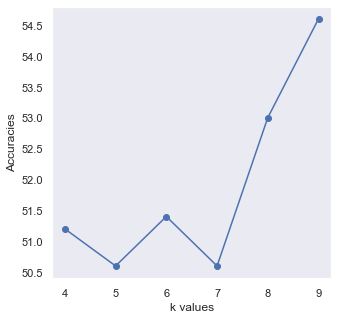

In [66]:
plt.plot(neighbors,metric_k,'o-')
plt.xlabel('k values')
plt.ylabel('Accuracies')
plt.grid()

In [67]:
knn =  KNeighborsClassifier(n_neighbors=9)
knn.fit(x_train,y_train)
y_pred_knn = knn.predict(x_test) 
print('accuracy_score of KNN :',accuracy_score(y_test,y_pred_knn))


accuracy_score of KNN : 0.546


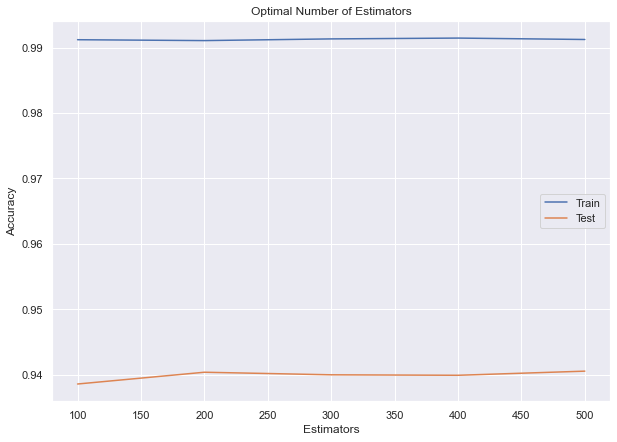

   n_neighbors  train_accuracy  test_accuracy
0          100        0.991192       0.938552
1          200        0.991058       0.940351
2          300        0.991316       0.939959
3          400        0.991443       0.939886
4          500        0.991227       0.940517


In [68]:
from sklearn.ensemble import RandomForestRegressor
train_accuracy=[]
test_accuracy=[]
for i in range(100,600,100):
    c=RandomForestRegressor(n_estimators=i)
    c.fit(x_train,y_train)
    train_accuracy.append(c.score(x_train,y_train))
    test_accuracy.append(c.score(x_test,y_test))
frame=pd.DataFrame({"n_neighbors":range(100,600,100),"train_accuracy":train_accuracy,"test_accuracy":test_accuracy})
plt.figure(figsize=(10,7))
plt.plot(range(100,600,100),frame["train_accuracy"],label="Train")
plt.plot(range(100,600,100),frame["test_accuracy"],label="Test")
plt.title("Optimal Number of Estimators")
plt.xlabel("Estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
print(frame)


### Comparing Accuracies of all the models using Bar Chart

In [69]:
#Classifiers
classifiers=["LogisticRegression","GaussianNB","SVM","DecisionTreeClassifier","RandomForestClassifier","KNeighborsClassifier"]
accuracy_=[acrr,ac_nb,ac_svm,ac_DT,ac_RF,ac_KNN]
df_ac=pd.DataFrame({'model':classifiers,"accuracy":accuracy_})
px.histogram(data_frame=df_ac,x="model",y="accuracy")

### Performing K-Fold and Cross Validation on all the algorithms to get better accuracy and result

In [70]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score


In [71]:

kfold = KFold(n_splits = 10)
xyz = []
accuracy = []

In [72]:
classifiers=["Logistic Regression", "Naive Bayes", "SVM", "Decision Tree", "Random Forest","KNeighborsClassifier"]

models=[SVC(kernel='rbf'),LogisticRegression(),DecisionTreeClassifier(),RandomForestClassifier(n_estimators=300,random_state=0),GaussianNB(),KNeighborsClassifier(n_neighbors=9)]

In [73]:

for i in models:
    model = i
    kfold=KFold(n_splits=10,random_state=50,shuffle=True)
    cv_result=cross_val_score(model,x_train,y_train,cv=kfold,scoring="accuracy")
    cv_result = cv_result
    xyz.append(cv_result.mean())
    accuracy.append(cv_result)
    print("{}: {},{}".format(i,cv_result.mean(), cv_result.std()))
    


SVC(): 0.8560000000000001,0.027194770739161527
LogisticRegression(): 0.9593333333333331,0.015333333333333348
DecisionTreeClassifier(): 0.8153333333333332,0.032530327730015615
RandomForestClassifier(n_estimators=300, random_state=0): 0.8733333333333333,0.03425395354310702
GaussianNB(): 0.8033333333333335,0.03901566636906541
KNeighborsClassifier(n_neighbors=9): 0.5266666666666666,0.02211083193570267


In [74]:
cv_models_datafeame= pd.DataFrame(xyz, index = classifiers)
cv_models_datafeame.columns = ['CV Mean']
cv_models_datafeame
cv_models_datafeame.sort_values(['CV Mean'], ascending =[0])

,CV Mean
Naive Bayes,0.959333
Decision Tree,0.873333
Logistic Regression,0.856000
SVM,0.815333
Random Forest,0.803333
KNeighborsClassifier,0.526667


### Plotting Box Plot Accuracies we got from Cross Validation and K-fold

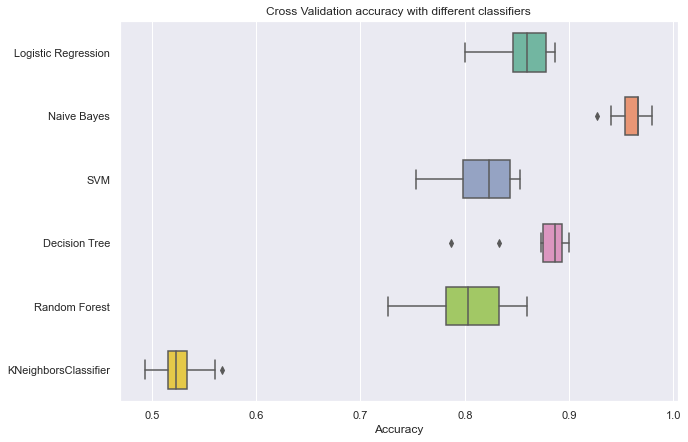

In [75]:

box = pd.DataFrame(accuracy, index = [classifiers])
boxT = box.T
plt.figure(figsize = (10,7))
ax = sns.boxplot(data = boxT, orient = "h", palette = "Set2", width = 0.6)
ax.set_yticklabels(classifiers)
ax.set_title('Cross Validation accuracy with different classifiers')
ax.set_xlabel('Accuracy')

plt.show()

## Best Model

 Now let’s train the mobile price classification model using Python. As this is a problem of classification, I will be using the Logistic Regression algorithm provided by Scikit-learn:

 Logistic Regression gives highest Accuracy score and hence decided to proceed with Logistic Regression.
 So the model gives an accuracy of about 95.5% which is great. Now let’s have a look at the predictions made by the model: